**Import libraries and load pointcloud and calibration data**

In [10]:
import numpy as np
import glob
import re
import open3d as o3d
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# pcd_files = glob.glob('/home/mfi/repos/rtc_vision_toolbox/data/demonstrations/place_demo_pcds/wp-place/2024-04-05-18-42-58/*.npz')
pcd_files = glob.glob('/home/mfi/repos/rtc_vision_toolbox/data/demonstrations/place_demo_pcds/wp-grasp-place-0/2024-04-25-17-34-34/*.npz')

cameras = {}
for filepath in pcd_files:
    filename = filepath.split('/')[-1]
    match = re.match(r"([a-zA-Z0-9]+)[_|-](.+).npz", filename)
    camera = match.group(1)
    if camera not in cameras.keys():
        cameras[camera] = {
            'pcds': {}
        }
    
    pcd = np.load(filepath)['arr_0']
    cameras[camera]['pcds'][match.group(2)] = pcd
    
# print(f'cameras: \n{cameras}')

transform_files = glob.glob(f'/home/mfi/repos/rtc_vision_toolbox/data/calibration_data/T_*.npy')
transforms = []
for filepath in transform_files:
    print(f'filename: {filepath.split("/")[-1]}')
    transform = np.load(filepath, allow_pickle=True)
    transforms.append(transform)



BASE2CAM_TF = {
    'CL8FC3100RL': transforms[2], # this is T_base2cam0.npy
    'CL8FC3100W3': transforms[1], # this is T_base2cam1.npy
    'CL8FC3100NM': transforms[0], # this is T_base2cam2.npy
}

filename: T_base2cam2.npy
filename: T_base2cam1.npy
filename: T_base2cam0.npy


**Print and visualize transformation matrices for each camera**

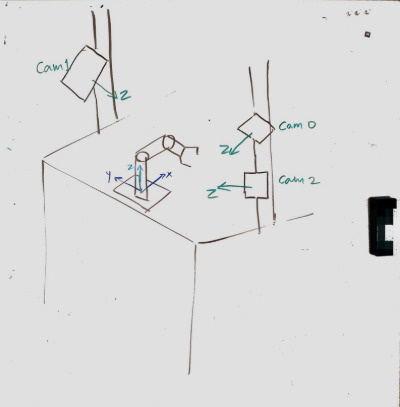

In [11]:
# BASE2CAM_TF['CL8FC3100NM'][0,2] = 0.0
# BASE2CAM_TF['CL8FC3100NM'][1,2] = 1.0
# BASE2CAM_TF['CL8FC3100NM'][2,2] = 0.0

from scipy.spatial.transform import Rotation as R

T = np.array([
    [0, -1, 0, 0],
    [0, 0, -1, 0],
    [1, 0, 0, 0],
    [0, 0, 0, 1]
])

i = 0
for tf in BASE2CAM_TF:
    T_old = BASE2CAM_TF[tf]
    T_new = np.matmul(T_old, T)
    #print(f'cam{i} {tf}:\n{T_old}')
    print(f'cam{i} {tf}:\n{T_new}')
    print(f'pos: {T_old[:3,3]}')
    print(f'quat: {R.from_matrix(T_new[:3,:3]).as_quat()}\n')
    i += 1
  
print('\n')
for each in cameras:
    print(f'camera {each} has {len(cameras[each]["pcds"])} pcds')

cam0 CL8FC3100RL:
[[-0.00839604 -0.01614347 -0.99983443  0.22871145]
 [ 0.53759101 -0.84315664  0.00909934 -0.54673568]
 [-0.84316393 -0.5374256   0.01575776  0.64873757]
 [ 0.          0.          0.          1.        ]]
pos: [ 0.22871145 -0.54673568  0.64873757]
quat: [-0.67435207 -0.19331428  0.68324784  0.20261113]

cam1 CL8FC3100W3:
[[-0.00372424 -0.02548761 -0.9996682   0.24031213]
 [-0.90251481 -0.43042013  0.01433631  0.5739147 ]
 [-0.43064272  0.90226875 -0.02139996  0.56335116]
 [ 0.          0.          0.          1.        ]]
pos: [0.24031213 0.5739147  0.56335116]
quat: [ 0.60168427 -0.38558529 -0.59429463  0.3689362 ]

cam2 CL8FC3100NM:
[[ 1.44502453e-02 -7.24217583e-03 -9.99869362e-01  2.21182673e-01]
 [ 9.99895572e-01 -8.42869726e-05  1.44512346e-02 -5.58007190e-01]
 [-1.88934343e-04 -9.99973772e-01  7.24020157e-03  4.14548984e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pos: [ 0.22118267 -0.55800719  0.41454898]
quat: [-0.50182027 -0.49452

In [12]:
def visualize_frame_axes(transformation_matrices):
    fig = go.Figure()

    colors = ['red', 'green', 'blue']  # X, Y, Z axis colors

    for T in transformation_matrices:
        origin = T[:3, 3]
        axes = T[:3, :3]

        for i in range(3):
            axis_end = origin + 0.2*axes[:, i]
            fig.add_trace(go.Scatter3d(
                x=[origin[0], axis_end[0]],
                y=[origin[1], axis_end[1]],
                z=[origin[2], axis_end[2]],
                mode='lines',
                line=dict(color=colors[i], width=4),
                name='Axis ' + str(i+1)
            ))

    fig.update_layout(scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z'),
    ), title='Frame Axes Visualization')

    fig.show()
    
T = [np.array(BASE2CAM_TF['CL8FC3100RL'])]
T.append(np.array(BASE2CAM_TF['CL8FC3100W3']))
T.append(np.array(BASE2CAM_TF['CL8FC3100NM']))

origin = np.array([[1, 0, 0, 0],
                    [0, 1, 0, 0],
                    [0, 0, 1, 0],
                    [0, 0, 0, 1]])
T.append(origin)

visualize_frame_axes(T)

---
### PCD
**Transform the PCD points using tf matrices**

In [13]:
# Closest is 
#   CL8FC3100RL : T_base2cam0.npy
#   CL8FC3100NM : T_base2cam2.npy

out_of_way_pcds_world = []
out_of_way_pcds_world_tf = []
for camera, data in cameras.items():
    # if camera in ['CL8FC3100W3', 'CL8FC3100RL']:
    #     continue
    if 'out_of_way' in data['pcds'].keys():
        pcd = data['pcds']['out_of_way'] / 1000 # convert to meters
        
        print(f'\npcd: {pcd.shape}')
        print(f'BASE2CAM_TF: {BASE2CAM_TF[camera].shape}')
        
        o3d_pcd = o3d.geometry.PointCloud()
        o3d_pcd.points = o3d.utility.Vector3dVector(pcd)
        
        o3d_pcd = o3d_pcd.uniform_down_sample(100)
        np_pcd = np.asarray(o3d_pcd.points)
        print(f'np_pcd: {np_pcd.shape}')
        
        np_pcd_h = np.hstack((np_pcd, np.ones((np_pcd.shape[0], 1))))
        print(f'np_pcd_h: {np_pcd_h.shape}')
        
        # np_pcd_h = np.matmul(np.array([
        #     [0, 0, 1, 0],
        #     [1, 0, 0, 0],
        #     [0, 1, 0, 0],
        #     [0, 0, 0, 1]
        # ]), np_pcd_h.T).T
        
        np_pcd_tf = np.matmul(BASE2CAM_TF[camera], np_pcd_h.T).T[:, :3]
        print(f'np_pcd_tf: {np_pcd_tf.shape}')

        out_of_way_pcds_world.append(np_pcd)
        out_of_way_pcds_world_tf.append(np_pcd_tf)


pcd: (524292, 3)
BASE2CAM_TF: (4, 4)
np_pcd: (5243, 3)
np_pcd_h: (5243, 4)
np_pcd_tf: (5243, 3)

pcd: (836140, 3)
BASE2CAM_TF: (4, 4)
np_pcd: (8362, 3)
np_pcd_h: (8362, 4)
np_pcd_tf: (8362, 3)

pcd: (657168, 3)
BASE2CAM_TF: (4, 4)
np_pcd: (6572, 3)
np_pcd_h: (6572, 4)
np_pcd_tf: (6572, 3)


**Visualize PCDs**

In [15]:
import numpy as np
import plotly.graph_objs as go

def plot_multi_np(plist):
    """
    Args: plist, list of numpy arrays of shape, (1,num_points,3)
    """
    colors = [
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#e377c2',  # raspberry yogurt pink
        '#8c564b',  # chestnut brown
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf',  # blue-teal
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#e377c2',  # raspberry yogurt pink
        '#8c564b',  # chestnut brown
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf',  # blue-teal
        '#1f77b4',  # muted blue
        '#ff7f0e',  # safety orange
        '#2ca02c',  # cooked asparagus green
        '#d62728',  # brick red
        '#9467bd',  # muted purple
        '#e377c2',  # raspberry yogurt pink
        '#8c564b',  # chestnut brown
        '#7f7f7f',  # middle gray
        '#bcbd22',  # curry yellow-green
        '#17becf',  # blue-teal
    ]
    skip = 1
    go_data = []
    for i in range(len(plist)):
        p_dp = plist[i]
        plot = go.Scatter3d(x=p_dp[::skip,0], y=p_dp[::skip,1], z=p_dp[::skip,2], 
                     mode='markers', marker=dict(size=2, color=colors[i],
                     symbol='circle'))
        go_data.append(plot)
 
    layout = go.Layout(
        scene=dict(
            aspectmode='data',
        ),
        height=1200,
        width=900,
    )
    
    colors = ['red', 'green', 'blue']  # X, Y, Z axis colors
    
    fig = go.Figure()

    for tf in T:
        origin = tf[:3, 3]
        axes = tf[:3, :3]

        for i in range(3):
            axis_end = origin + 0.3*axes[:, i]
            fig.add_trace(go.Scatter3d(
                x=[origin[0], axis_end[0]],
                y=[origin[1], axis_end[1]],
                z=[origin[2], axis_end[2]],
                mode='lines',
                line=dict(color=colors[i], width=4),
                name='Axis ' + str(i+1)
            ))

    for plot in go_data:
        fig.add_trace(plot)

    # add axis lines and camera view
    fig.update_layout(scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z'),
        camera = dict(
                      eye=dict(x=-1.30, y=0, z=-.25),
                      center=dict(x=0., y=0, z=-0.25),
                      up=dict(x=0, y=0, z=1),
                     )
        ),
        height=800,
        width=1200,
    )
                      
    fig.show()

plot_multi_np(out_of_way_pcds_world_tf)

In [19]:
from typing import Tuple

def filter_point_cloud_bounds(pointcloud: np.ndarray, x_range: Tuple[float, float], y_range: Tuple[float, float], z_range: Tuple[float, float]) -> np.ndarray:
    return pointcloud[
        (pointcloud[:,0] > x_range[0]) & \
        (pointcloud[:,0] < x_range[1]) & \
        (pointcloud[:,1] > y_range[0]) & \
        (pointcloud[:,1] < y_range[1]) & \
        (pointcloud[:,2] > z_range[0]) & \
        (pointcloud[:,2] < z_range[1])
    ]

grasp_pcd_inhand_frame = np.load('/home/mfi/repos/rtc_vision_toolbox/data/demonstrations/place_demo_pcds/2024-04-05-18-42-58/CL8FC3100NM-0_in_hand.npz', allow_pickle=True)['arr_0']
grasp_pcd_inhand_frame = grasp_pcd_inhand_frame / 1000 # convert to meters
grasp_pcd_inhand_frame_filtered = filter_point_cloud_bounds(grasp_pcd_inhand_frame, (-0.05, 0.05), (-0.05, 0.05), (0.0, 0.45))
print(f'grasp_pcd_inhand_frame_filtered: {grasp_pcd_inhand_frame_filtered.shape}')

gripper_inhand_pose = np.load('/home/mfi/repos/rtc_vision_toolbox/data/demonstrations/place_demo_preprogrammed_poses/close_up_pose.npz', allow_pickle=True)['arr_0']
print(f'gripper_inhand_pose: {gripper_inhand_pose}')

gripper_place_pose = np.load('/home/mfi/repos/rtc_vision_toolbox/data/demonstrations/place_demo_preprogrammed_poses/placement_pose.npz', allow_pickle=True)['arr_0']
print(f'gripper_place_pose: {gripper_place_pose}')

grasp_pcd_inhand_frame_filtered_h = np.hstack((grasp_pcd_inhand_frame_filtered, np.ones((grasp_pcd_inhand_frame_filtered.shape[0], 1))))

grasp_pcd_inhand_pose = np.matmul(BASE2CAM_TF['CL8FC3100NM'], grasp_pcd_inhand_frame_filtered_h.T).T
grasp_pcd_origin_pose = np.matmul(np.linalg.inv(gripper_inhand_pose), grasp_pcd_inhand_pose.T).T
grasp_pcd_place_pose = np.matmul(gripper_place_pose, grasp_pcd_origin_pose.T).T
plot_multi_np(out_of_way_pcds_world_tf + [grasp_pcd_inhand_pose, grasp_pcd_place_pose])

# new_o3d_in_hand_pcd_tf = o3d_in_hand_pcd.transform(np.linalg.inv(in_hand_pose))
# new_new_o3d_in_hand_pcd_tf = new_o3d_in_hand_pcd_tf.transform(place_pose)

# np_in_hand_pcd_tf = np.asarray(new_new_o3d_in_hand_pcd_tf.points)

# plot_multi_np([np_in_hand_pcd_tf, np_in_hand_pcd])

grasp_pcd_inhand_frame_filtered: (32433, 3)
gripper_inhand_pose: [[ 9.96149896e-01 -6.73088924e-02 -5.61684725e-02  2.43777517e-01]
 [-5.62677809e-02  4.20991027e-04 -9.98415625e-01 -3.73881537e-03]
 [ 6.72258963e-02  9.97732096e-01 -3.36795184e-03  4.05677378e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
gripper_place_pose: [[ 9.99921280e-01 -1.25379483e-02 -4.82717689e-04  2.42363213e-01]
 [-1.25471574e-02 -9.99311988e-01 -3.49015602e-02 -2.43161435e-01]
 [-4.47916154e-05  3.49048695e-02 -9.99390638e-01  4.62955881e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [24]:
from typing import Dict, Any

# Optionally merge all point clouds here, any other preprocessing, etc.
goal_anchor_points = out_of_way_pcds_world_tf[list(BASE2CAM_TF.keys()).index('CL8FC3100RL')]
goal_anchor_points = filter_point_cloud_bounds(goal_anchor_points, (0.1, 0.5), (-0.5, -0.02), (0.1, 0.3))
goal_anchor_points = goal_anchor_points[:, :3] # Only take XYZ

goal_action_points = grasp_pcd_place_pose[:, :3] # Only take XYZ

# plot_multi_np([goal_anchor_points, goal_action_points])

print(f'goal_anchor_points: {goal_anchor_points.shape}')
print(f'goal_action_points: {goal_action_points.shape}')

clouds = np.concatenate((goal_action_points, goal_anchor_points), axis=0)
colors = np.zeros((clouds.shape[0], 3))
classes = np.concatenate((np.zeros(goal_action_points.shape[0]), np.ones(goal_anchor_points.shape[0])), axis=0)

save_path = '/home/mfi/repos/rtc_vision_toolbox/data/train_data/taxpose/nist_waterproof/place'
taxpose_demo_dict = np.savez_compressed(
    f'{save_path}/0_teleport_obj_points.npz',
    clouds=clouds,
    colors=colors,
    classes=classes   
)

goal_anchor_points: (7037, 3)
goal_action_points: (32433, 3)
